# Аналитика в Яндекс.Афише  

## Описание проекта  

На основе данных о посещениях сайта Яндекс.Афиши изучить, как люди пользуются продуктом, когда они начинают покупать, сколько денег приносит каждый клиент, когда он окупается

## Содержание  


* [1.Описание данных и задач](#данные)
* [2.Импорт библиотек и изучение общей информации](#импорт)
    * [2.1 Датафрейм "Visits" (лог сервера с информацией о посещениях сайта)](#визиты) 
    * [2.2 Датафрейм "Orders" (информация о заказах)](#заказы)
    * [2.3 Датафрейм "Costs" (информация о затратах на маркетинг)](#затраты)
* [3.Анализ данных по продукту (DAU, WAU, MAU, Retention)](#АДП)
    * [3.1 Подготовка данных](#АДППД) 
    * [3.2 Расчет количества уникальных пользователей в день (DAU)](#АДПДАУ)
    * [3.3 Расчет количества уникальных пользователей в неделю (WAU)](#АДПВАУ)
    * [3.4 Расчет количества уникальных пользователей в месяц (МAU)](#АДПМАУ)
    * [3.5 Расчет количества сессий в день](#АДПКС)
    * [3.6 Расчет длительности одной сессии](#АДПДС)
    * [3.7 Расчет коэффициента удержания](#АДПРР)
* [4.Анализ данных по продажам](#АДПРОД)
    * [4.1 Расчет времени начала покупок](#АДПРОДВРЕМЯ) 
    * [4.2 Расчет количества покупок в месяц](#АДПРОДПЕР)
    * [4.3 Расчет средней суммы покупки](#АДПРОДЧЕК)
    * [4.4 Расчет показателя LTV](#АДПLTV)
* [5.Анализ данных по маркетингу](#МАРК)
    * [5.1 Расчет суммарной выручки и суммарных затрат на маркетин](#МАРКСУМ) 
    * [5.2 Расчет суммарной выручки по месяцам по когортам](#МАРКСУМВЫР)
    * [5.3 Расчет ежемесячных затрат на маркетинг по источникам рекламы](#МАРКЗИ)
    * [5.4 Расчет затрат, выручки и количества привлеченных пользователей и покупателей в разбивке по источникам рекламы](#МАРКОИ)
    * [5.5 Стоимость привлечения одного покупателя из каждого источника рекламы](#МАРКСП)
    * [5.8 Расчет ROMI](#МАРКРОМИ)
* [6.Анализ данных в разрезе категории устройства пользователя](#УСТР)
    * [6.1 Детализация посещений сайта по категории устройства пользователя](#УСТРПОС)
    * [6.2 Расчет выручки в разбивке по категории устройства](#УСТРВЫР)
    * [6.3 Расчет коэффициента удержания в разрезе категории устройства](#УСТРРР)
* [7.Общий вывод](#ВЫВОД)    

# 1. Описание данных <a name="данные"></a>

### Таблица **visits** (лог сервера с информацией о посещениях сайта):  

* **Uid** — уникальный идентификатор пользователя
* **Device** — категория устройства пользователя
* **Start Ts** — дата и время начала сессии
* **End Ts** — дата и время окончания сессии
* **Source Id** — идентификатор рекламного источника, из которого пришел пользователь  


### Таблица **orders** (информация о заказах):  

* **Uid** — уникальный id пользователя, который сделал заказ
* **Buy Ts** — дата и время заказа
* **Revenue** — выручка Яндекс.Афиши с этого заказа  


### Таблица costs (информация о затратах на маркетинг):  

* **source_id** — идентификатор рекламного источника
* **dt** — дата
* **costs** — затраты на этот рекламный источник в этот день

## 2. Импорт библиотек и изучение общей информации <a name="импорт"></a>

In [1]:
# импортируем библиотеки
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import seaborn as sns
import plotly.express as px
from matplotlib.ticker import FuncFormatter
import datetime
import decimal
import plotly.graph_objects as go

In [2]:
# сохраняем данные  в переменные visits, orders, costs
visits = pd.read_csv('')
orders = pd.read_csv('')
costs = pd.read_csv('')

Напишем функцию с помощью которой будем выводить информацию о датафреймах

In [3]:
def total_info(data, name):
    print(name)
    display(data.head())
    print('*************************************')
    display(data.info()) 
    print('*************************************')
    print("Число дубликатов:", data.duplicated().sum())
    print('*************************************')

Приступим к ознакомлению с данными.

**Датафрейм "Visits" (лог сервера с информацией о посещениях сайта)**<a name="визиты"></a>

In [4]:
total_info(visits, 'Информация о посещениях сайта Яндекс.Афиша')

Информация о посещениях сайта Яндекс.Афиша


,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


*************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
Device       359400 non-null object
End Ts       359400 non-null object
Source Id    359400 non-null int64
Start Ts     359400 non-null object
Uid          359400 non-null uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 13.7+ MB


None

*************************************
Число дубликатов: 0
*************************************


Данные полные, пропусков и дубликатов нет.   

Для дальнейшей работы переименуем столбцы и приведем столбцы содержащие даты к типу datetime (сейчас они имеют тип object)

In [5]:
# переименуем колонки
visits = visits.rename(columns={'End Ts': 'session_end', 'Start Ts': 'session_start', 'Source Id': 'source_id'})
visits.columns = visits.columns.str.lower()
# приведем данные с датами к типу datetime
visits['session_start'] = pd.to_datetime(visits['session_start'])
visits['session_end'] = pd.to_datetime(visits['session_end'])
# для удобства изменим порядок столбцов
visits = visits[['device', 'source_id', 'session_start', 'session_end', 'uid']]

In [6]:
# посмотрим на обновленный датафрейм
visits.tail()

,device,source_id,session_start,session_end,uid
359395,desktop,2,2017-07-29 19:07:00,2017-07-29 19:07:19,18363291481961487539
359396,touch,1,2018-01-25 17:38:00,2018-01-25 17:38:19,18370831553019119586
359397,desktop,4,2018-03-03 10:12:00,2018-03-03 10:12:19,18387297585500748294
359398,desktop,5,2017-11-02 10:12:00,2017-11-02 10:12:19,18388616944624776485
359399,touch,2,2017-09-10 13:13:00,2017-09-10 13:13:19,18396128934054549559


**Датафрейм "Orders" (информация о заказах)**<a name="заказы"></a>

In [7]:
total_info(orders, 'Информация о заказах на сайте Яндекс.Афиша')

Информация о заказах на сайте Яндекс.Афиша


,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


*************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
Buy Ts     50415 non-null object
Revenue    50415 non-null float64
Uid        50415 non-null uint64
dtypes: float64(1), object(1), uint64(1)
memory usage: 1.2+ MB


None

*************************************
Число дубликатов: 0
*************************************


Данные полные, пропусков и дубликатов нет.   

Для дальнейшей работы переименуем столбцы и приведем столбцы содержащие даты к типу datetime (сейчас они имеют тип object)

In [8]:
# переименуем колонки
orders = orders.rename(columns={'Buy Ts': 'purchase_date'})
orders.columns = orders.columns.str.lower()
# приведем данные с датами к типу datetime
orders['purchase_date'] = pd.to_datetime(orders['purchase_date'])
# для удобства изменим порядок столбцов
orders = orders[['revenue', 'purchase_date', 'uid']]

In [9]:
# посмотрим на обновленный датафрейм
orders.tail()

,revenue,purchase_date,uid
50410,4.64,2018-05-31 23:50:00,12296626599487328624
50411,5.80,2018-05-31 23:50:00,11369640365507475976
50412,0.30,2018-05-31 23:54:00,1786462140797698849
50413,3.67,2018-05-31 23:56:00,3993697860786194247
50414,3.42,2018-06-01 00:02:00,83872787173869366


**Датафрейм "Costs" (информация о затратах на маркетинг)**<a name="затраты"></a>

In [10]:
total_info(costs, 'Информация о затратах на маркетинг')

Информация о затратах на маркетинг


,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


*************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
source_id    2542 non-null int64
dt           2542 non-null object
costs        2542 non-null float64
dtypes: float64(1), int64(1), object(1)
memory usage: 59.7+ KB


None

*************************************
Число дубликатов: 0
*************************************


Данные полные, пропусков и дубликатов нет.   

Для дальнейшей работы переименуем столбцы и приведем столбец содержащий даты к типу datetime (сейчас он имеет тип object)

In [11]:
# переименуем колонку с датой
costs = costs.rename(columns={'dt': 'date'})
# приведем данные с датами к типу datetime
costs['date'] = pd.to_datetime(costs['date'])
# для удобства изменим порядок столбцов
costs = costs[['source_id', 'costs', 'date']]

In [12]:
# посмотрим на обновленный датафрейм
costs.head()

,source_id,costs,date
0,1,75.20,2017-06-01
1,1,62.25,2017-06-02
2,1,36.53,2017-06-03
3,1,55.00,2017-06-04
4,1,57.08,2017-06-05


**Вывод:** 
* данные полные, пропусков и дубликатов нет.

* у столбцов, содержащих даты изменили дип данных на datetime.   

* привели названия столбцов к единому формату.

## 3. Анализ данных по продукту (DAU, WAU, MAU, Retention) <a name="АДП"></a>

Ответим на следующие вопросы:  


* Сколько людей пользуются в день, неделю, месяц?  

* Сколько сессий в день?  

* Сколько длится одна сессия?  

* Как часто люди возвращаются?  

**Подготовим данные**<a name="АДППД"></a>

Для ответа на вопросы по каждой строке добавим информацию по дате сессии, по номеру недели и по месяцу. Также добавим столбец с длительностью сессии (в минутах):

In [13]:
# создаем столбец с датой
visits['session_date'] = visits['session_start'].dt.date
# создаем столбец с номером недели
visits['session_week'] = visits['session_start'].astype('datetime64[W]')
# создаем столбец с месяцем
visits['session_month'] = visits['session_start'].astype('datetime64[M]')
# создаем столбец с длительностью сессии в минутах
visits['session_duration'] = visits['session_end'] - visits['session_start']
visits['session_duration'] = visits['session_duration'].apply(lambda x: decimal.Decimal(x.seconds) // 60)
visits['session_duration'] = visits['session_duration'].astype('int')

In [14]:
# посмотрим на обновленный датафрейм
visits.head()

,device,source_id,session_start,session_end,uid,session_date,session_week,session_month,session_duration
0,touch,4,2017-12-20 17:20:00,2017-12-20 17:38:00,16879256277535980062,2017-12-20,2017-12-14,2017-12-01,18
1,desktop,2,2018-02-19 16:53:00,2018-02-19 17:21:00,104060357244891740,2018-02-19,2018-02-15,2018-02-01,28
2,touch,5,2017-07-01 01:54:00,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017-06-29,2017-07-01,0
3,desktop,9,2018-05-20 10:59:00,2018-05-20 11:23:00,16174680259334210214,2018-05-20,2018-05-17,2018-05-01,24
4,desktop,3,2017-12-27 14:06:00,2017-12-27 14:06:00,9969694820036681168,2017-12-27,2017-12-21,2017-12-01,0


**Расчет количества уникальных пользователей в день (DAU)**<a name="АДПДАУ"></a>

Для того, что бы рассчитать сколько людей пользуются сайтом в день, неделю, месяц напишем функцию

In [15]:
def product_metrics(column, title, name):
    data = visits.groupby(column).agg({'uid': 'nunique'}).reset_index()
    fig = px.bar(data, x=column, y='uid',title = title,\
             labels={column:'Дата', 'uid':'Количество пользователей'}, color='uid', height=450)
    print(name, ": {0:.0f} пользователей".format(data['uid'].mean()))
    fig.show()

In [16]:
product_metrics('session_date', 'Динамика изменения показателя DAU', 'Количество уникальных пользователей в день (DAU)')

Количество уникальных пользователей в день (DAU) : 908 пользователей


Средний показатель DAU: 908 пользователей.   

Судя по графику, 24 ноября 2017 год произошел всплеск посещений, количество визитёров на сайте увеличилось более чем в три раза, скорее всего была анонсированы большие скидки на билеты, т.к. это последняя пятница ноября, так называемая "Чёрная Пятница".
А 30-31 марта 2018 года аномальное мало число посещений, либо были технические проблемы с сайтом и люди не могли зайти на сайт, либо данные некорректно выгружены за этот период.

**Расчет количества уникальных пользователей в неделю (WAU)**<a name="АДПВАУ"></a>

In [17]:
product_metrics('session_week', 'Динамика изменения показателя WAU', 'Количество уникальных пользователей в неделю (WAU)')

Количество уникальных пользователей в неделю (WAU) : 5724 пользователей


Средний показатель WAU: 5724 пользователей.   

Недельная динамика похожа на ежедневную, так же наблюдаем пик в конце ноября 2017.

**Расчет количества уникальных пользователей в месяц (МAU)**<a name="АДПМАУ"></a>

In [18]:
product_metrics('session_month', 'Динамика изменения показателя MAU', 'Количество уникальных пользователей в месяц (MAU)')

Количество уникальных пользователей в месяц (MAU) : 23228 пользователей


Средний показатель MAU: 23228  

По месячной динамике можно отметить, что летом билетами интересуются практически в два раза реже, интерес к посещениям развлекательных мероприятий начинает расти с началом осени, когда заканчиваются отпуска и все возвращаются с дач и морей.   
Пик продаж в ноябре и декабре, думаю это связано с традиционной распродажей "Чёрная Пятница" и покупкой билетов на новогодние мероприятия.
С мая (с началом теплого периода) активность начинает снижаться.

**Расчет количества сессий в день**<a name="АДПКС"></a>

In [19]:
# сгруппируем датафрейм visits по столбцу с датой сессии и посчитаем количество посещений
session_count_data = visits.groupby('session_date').agg({'uid': 'count'}).reset_index()
fig = px.line(session_count_data, x='session_date', y='uid',\
             title = 'Динамика количества сессий в день',\
             labels={'session_date':'Дата', 'uid':'Количество сессий'}, height=450)
print("Количество сессий в день {0:.2f} ".format(session_count_data['uid'].mean()))
fig.show()

Количество сессий в день 987.36 


Количество сессий в день 987, то есть с учетом того, что DAU=908, получается, что в среднем пользователь заходит на сайт 1 раз в день

**Расчет длительности одной сессии**<a name="АДПДС"></a>

Посмотрим основные статистические характеристики  столбца 'session_duration' датафрейма visits

In [20]:
visits['session_duration'].describe()

count    359400.000000
mean         10.724343
std          16.939390
min           0.000000
25%           2.000000
50%           5.000000
75%          14.000000
max        1408.000000
Name: session_duration, dtype: float64

In [21]:
visits['session_duration'].mode()

0    1
dtype: int64

Среднее значение длительности сессии чуть больше 10 минут, медианное значение длительности 5 минут, мода равна 1 минуте  

**Построим диаграмму размаха длительности интернет-сессий и отфильтруем выбросы**<a name="КОРРБДС"></a>

In [22]:
fig = px.box(visits.reset_index(), y='session_duration', title='Диаграмма размаха длительности интернет-сессий', height=450)
fig.show()

Выбросы начинаются от 32 минут, посмотрим на гистограмму распределения длительности сессий, ограниченную 32 минутами

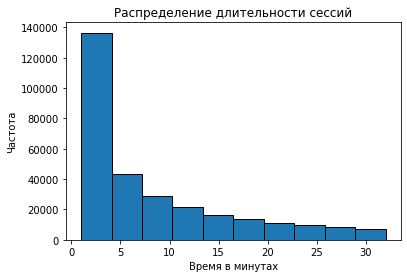

In [23]:
ax = visits['session_duration'].plot(title='Распределение длительности сессий', kind='hist', bins=10, ec='black', range=(1,32));
ax.set_xlabel('Время в минутах')
ax.set_ylabel('Частота');

Большинство сессий длятся около 3 минут.  

Посетители не задерживаются на сайте, практически сразу же уходят с него.

**Расчет коэффициента удержания**<a name="АДПРР"></a>

Мы анализируем данные сервиса по продаже билетов (театр, концерты), поэтому вряд ли большинство пользователей будет посещать сайт и выбирать билеты ежедневно или еженедельно.  
Значит для расчета коэффициента удержания сформируем когорты по месяцам и посмотрим возвращаются ли пользователи хотя бы раз в месяц  

In [24]:
# добавим столбец с месяцем первого посещения сайта
first_visit = visits.groupby(['uid'])['session_start'].min().reset_index()
first_visit.columns = ['uid', 'first_visit']
visits = visits.merge(first_visit)
visits['first_visit_month'] = visits['first_visit'].astype('datetime64[M]')
visits.head()

,device,source_id,session_start,session_end,uid,session_date,session_week,session_month,session_duration,first_visit,first_visit_month
0,touch,4,2017-12-20 17:20:00,2017-12-20 17:38:00,16879256277535980062,2017-12-20,2017-12-14,2017-12-01,18,2017-12-20 17:20:00,2017-12-01
1,desktop,2,2018-02-19 16:53:00,2018-02-19 17:21:00,104060357244891740,2018-02-19,2018-02-15,2018-02-01,28,2018-02-19 16:53:00,2018-02-01
2,touch,5,2017-07-01 01:54:00,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017-06-29,2017-07-01,0,2017-07-01 01:54:00,2017-07-01
3,desktop,9,2018-05-20 10:59:00,2018-05-20 11:23:00,16174680259334210214,2018-05-20,2018-05-17,2018-05-01,24,2018-03-09 20:05:00,2018-03-01
4,desktop,4,2018-03-09 20:05:00,2018-03-09 20:33:00,16174680259334210214,2018-03-09,2018-03-08,2018-03-01,28,2018-03-09 20:05:00,2018-03-01


In [25]:
# построим сводную таблицу с данными о коэффициенте удержания
visits['lifetime'] = (visits['session_month'] - visits['first_visit_month']) / np.timedelta64(1, 'M')
visits['lifetime'] = visits['lifetime'].round().astype('int')
cohort_visits = visits.groupby(['first_visit_month', 'lifetime']).agg({'uid': 'nunique'}).reset_index()
uid_first = cohort_visits[cohort_visits['lifetime'] == 0][['first_visit_month', 'uid']]
uid_first.columns = ['first_visit_month', 'uid_first']
cohort_visits = cohort_visits.merge(uid_first)
cohort_visits['retention'] = cohort_visits['uid'] / cohort_visits['uid_first']
visits_retention_pivot = cohort_visits.pivot_table(index = 'first_visit_month', 
                                                   columns = 'lifetime', values = 'retention', aggfunc = 'sum')

Напишем функцию для визуализации сводных таблиц

In [26]:
def heatmap_func(data, annot, fmt, title):
    sns.set(style = 'whitegrid')
    plt.figure(figsize = (16, 7))
    ax = sns.heatmap(data, annot=annot, fmt=fmt, linewidths=1, linecolor='white', cmap= 'coolwarm')
    ax.set_yticklabels(data.index.date)
    plt.title(title)
    plt.xlabel('Время использования Яндекс.Афиша (мес.)')
    plt.ylabel('Дата начала использования Яндекс.Афиша')
    plt.show()

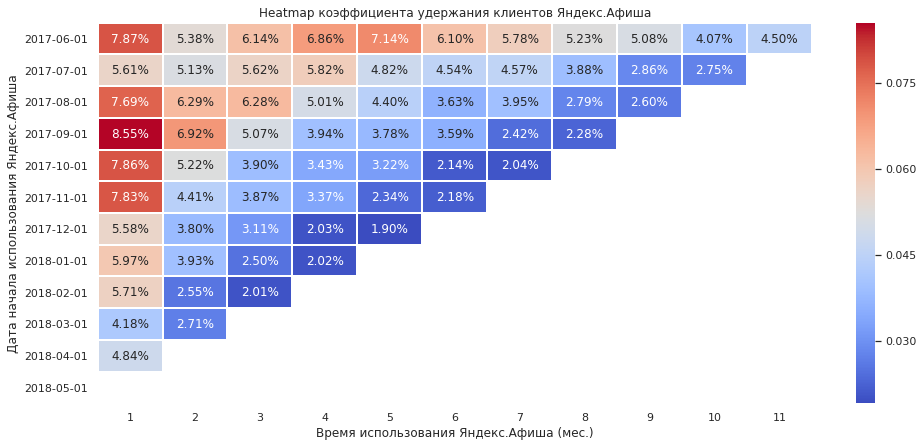

In [27]:
heatmap_func(visits_retention_pivot.iloc[:, 1:], True, '.2%', 'Heatmap коэффициента удержания клиентов Яндекс.Афиша')

Коэффициент удержания невысокий.   
Retention Rate второго месяца пользования нашим ресурсом находится в интервале от 4 до 8,5% в зависимости от когорты.  
После первого месяца, на второй, возвращается большая часть клиентов, далее, с течением времени, этот процент падает до 2,5-3%.  
Это справедливо для всех, кроме первой когорты, которая начала пользоваться ресурсом в июне 2017 года.   
Retention Rate когорты 01.06.2017 постоянно находится в "лидерах" по сравнению со всеми остальными когортами.

Посмотрим на количество активных пользователей в каждой когорте по месяцам, добавим число пользователей к коэффициенту RR

In [28]:
# получаем сводные таблицы относительного и абсолютного Retention Rate 
visits_retention_pivot_count = cohort_visits.pivot_table(index = 'first_visit_month', 
                                                   columns = 'lifetime', values = 'uid', aggfunc = 'sum')
visits_retention_pivot_rr = cohort_visits.pivot_table(index = 'first_visit_month', 
                                                   columns = 'lifetime', values = 'retention', aggfunc = 'sum')
visits_retention_pivot_rr = (visits_retention_pivot_rr * 100).round(2)

# создаем датафрейм, где в каждой ячейке фигурируют оба значения
df_retention_count_rr = pd.DataFrame(index=visits_retention_pivot_count.index, columns=visits_retention_pivot_count.columns) 
for col in visits_retention_pivot_count.columns:
    first_part = visits_retention_pivot_rr[col].astype('str') + '%' + '\n'
    second_part = visits_retention_pivot_count[col].astype('str').str.rstrip('0').str.rstrip('.')
    df_retention_count_rr[col] = first_part + second_part
df_retention_count_rr = df_retention_count_rr.replace('nan%\nnan', '')

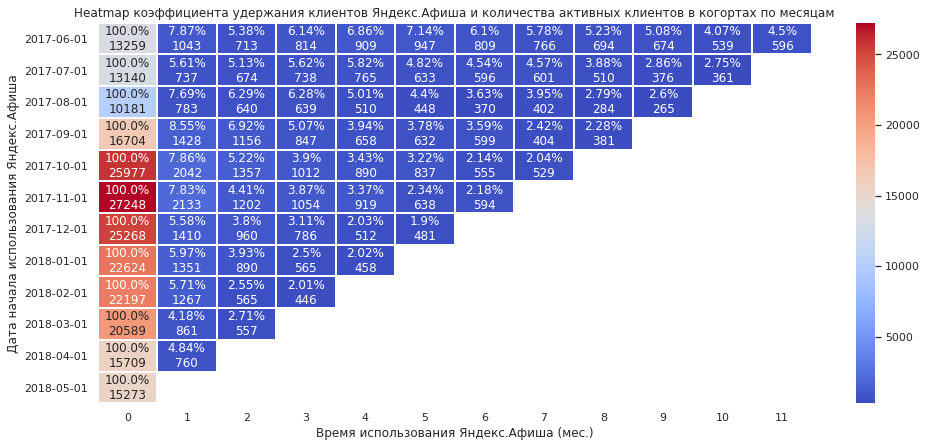

In [29]:
heatmap_func(visits_retention_pivot_count, df_retention_count_rr.values, '',\
             'Heatmap коэффициента удержания клиентов Яндекс.Афиша и количества активных клиентов в когортах по месяцам')

Здесь мы можем отметить, что начиная с октября средняя численность когорты значительно возросла - с 13 000 человек до 20 000+ человек.     
Retention Rate по более численным когортам немного ниже, чем у первых трех, тем не менее, у нас практически в 2 раза больше пользователей, продолжающих пользоваться Яндекс.Афиша по сравнению с первыми когортами (кроме первой, которая более активная на фоне остальных).

**Вывод:**
* DAU = 908  
* WAU = 5724  
* MAU = 23228  
* Максимальное число посещений сайта приходится на период с октября 2017 по  март 2018 года  
* В среднем каждый посетитель заходит на сайт 1 раз  
* Средняя продолжительность сессии 2,5 минуты  
* Коэффициент удержания клиентов невысокий: на второй месяц он равен от 4 до 8,5%, с последующим снижением до 2,5-3% 

## 4. Анализ данных по продажам <a name="АДПРОД"></a>

Ответим на следующие вопросы:

* Когда люди начинают покупать?
* Сколько раз покупают за период?
* Какой средний чек?
* Сколько денег приносят? (LTV)

**Расчет времени начала покупок**<a name="АДПРОДВРЕМЯ"></a>

Сгруппируем датафрейм orders по пользователям, чтобы найти дату их первого заказа, и датафрейм visits, чтобы найти дату первой сессии:

In [30]:
first_purchase_date = orders.groupby('uid')[['purchase_date']].min().reset_index()
first_purchase_date.columns = ['uid', 'first_purchase_date']
first_session_date = visits.groupby('uid')[['session_start']].min().reset_index()
first_session_date.columns = ['uid', 'first_session']

Сведем данные в общим датафрейм:

In [31]:
when_they_buy = first_purchase_date.merge(first_session_date, on='uid')
when_they_buy.head()

,uid,first_purchase_date,first_session
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00


In [32]:
# посчитаем сколько минут проходит между первым посещением сайта и первым заказом
when_they_buy['buy_diff'] = when_they_buy['first_purchase_date'] - when_they_buy['first_session']
when_they_buy['buy_diff'] = when_they_buy['buy_diff']/np.timedelta64(1, 'm')
when_they_buy['buy_diff'] = when_they_buy['buy_diff'].round(1)
when_they_buy.head()

,uid,first_purchase_date,first_session,buy_diff
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,154022.0
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0.0
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,79.0
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00,1184.0
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0.0


Сгруппируем датафрейм по пользователям и по каждому из них выберем минимальную разницу по времени (т.е. разницу между первой сессией и первой покупкой):

In [33]:
first_they_buy = when_they_buy.groupby('uid')[['buy_diff']].min()

In [34]:
first_they_buy.describe()

,buy_diff
count,36523.000000
mean,24340.175834
std,67784.774690
min,0.000000
25%,4.000000
50%,16.000000
75%,2897.000000
max,523144.000000


In [35]:
first_they_buy.mode()

,buy_diff
0,1.0


**Построим диаграммы размаха времени от первого визита до покупки**<a name="КОРРБП"></a>

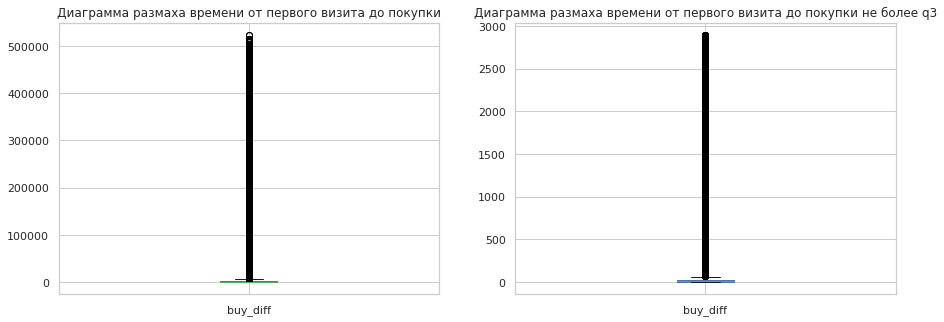

In [36]:
fig, axes = plt.subplots(1,2, figsize=(15,5))

first_they_buy.plot(kind='box', ax=axes[0], title='Диаграмма размаха времени от первого визита до покупки')
# ограничим верхнее время значением третьего квартиля,так как ниже лежит 75% всех значений
first_they_buy.query('buy_diff < 2897').plot(kind='box', ax=axes[1],\
                                             title='Диаграмма размаха времени от первого визита до покупки не более q3');

На второй диаграмме видим, что выбросы начинаются от 100 минут

Количество минут между первым посещением сайта и первым заказом:
* среднее значение: 24340 минут
* медианное значение: 16 минут
* мода: 1 минута
Посмотрим на распределение времени в минутах от первого визита на сайт до заказа.  

Чтобы посмотреть поближе, ограничим время от 1 минуты (мода) до 100 минут.

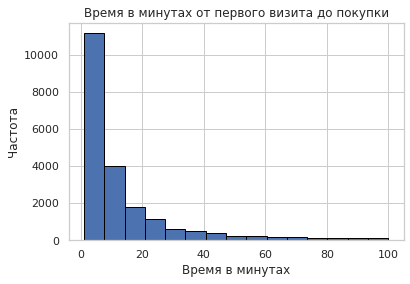

In [37]:
ax = first_they_buy['buy_diff'].plot(title='Время в минутах от первого визита до покупки',\
                                     kind='hist', bins=15, ec='black', range=(1,100));
ax.set_xlabel('Время в минутах')
ax.set_ylabel('Частота');

Так как распределение отличается от нормального примем в качестве среднего значения - медианное.

У большей части пользователей на заказ уходит не более 16 минут, т.е. люди заходят на сайт, выбирают мероприятие и оформляют заказ, не задерживаясь

**Покупки с нулевой длинной сессии** могут появиться если, например, у пользователя в браузере стоит какой-нибудь блокировщик всевозможных трекеров. Откуда тогда заказ? Такие вещи, как покупки, которые завязаны на реальные деньги, терять никак нельзя и они логируются не только на стороне пользователя (браузер или приложение), но и на стороне back-end’а (сервера).

**Расчет количества покупок в месяц**<a name="АДПРОДПЕР"></a>

За период возьмем месяц. Посмотрим, сколько каждый пользователь делает покупок за "свой" месяц.

In [38]:
# сгруппируем по пользователям и найдём для каждого время первого заказа
first_purchase = orders.groupby('uid')['purchase_date'].min().reset_index()
first_purchase.columns = ['uid', 'date_of_first_purchase']
order_frequency = pd.merge(orders, first_purchase, on='uid')
order_frequency.head()

,revenue,purchase_date,uid,date_of_first_purchase
0,17.00,2017-06-01 00:10:00,10329302124590727494,2017-06-01 00:10:00
1,0.55,2017-06-01 00:25:00,11627257723692907447,2017-06-01 00:25:00
2,0.37,2017-06-01 00:27:00,17903680561304213844,2017-06-01 00:27:00
3,0.55,2017-06-01 00:29:00,16109239769442553005,2017-06-01 00:29:00
4,0.37,2017-06-01 07:58:00,14200605875248379450,2017-06-01 07:58:00


Теперь добавим столбец time_difference, где будет в месяцах указано время "пребывания" каждого пользователя с момента первого визита на момент конкретного заказа:

In [39]:
def diff_month(row):
    date1 = row['purchase_date']
    date2 = row['date_of_first_purchase']
    return (date1.year - date2.year) * 12 + date1.month - date2.month

order_frequency['time_difference'] = order_frequency.apply(diff_month, axis=1)
order_frequency['date_of_first_purchase'] = order_frequency['date_of_first_purchase'].astype('datetime64[M]')
order_frequency.tail()

,revenue,purchase_date,uid,date_of_first_purchase,time_difference
50410,4.64,2018-05-31 23:50:00,12296626599487328624,2018-05-01,0
50411,5.80,2018-05-31 23:50:00,11369640365507475976,2018-05-01,0
50412,0.30,2018-05-31 23:54:00,1786462140797698849,2018-05-01,0
50413,3.67,2018-05-31 23:56:00,3993697860786194247,2018-05-01,0
50414,3.42,2018-06-01 00:02:00,83872787173869366,2018-06-01,0


Выделим когорты по первой сессии и по месяцам и посчитаем количество заказов за данный конкретный месяц, количество уникальных пользователей и количество заказов на одного пользователя:

In [40]:
purchases_grouped_by_cohorts = (order_frequency
                                                .groupby(['date_of_first_purchase','time_difference'])
                                                .agg({'purchase_date': 'count', 'uid': 'nunique'}))

purchases_grouped_by_cohorts['purchases_per_player'] = \
purchases_grouped_by_cohorts['purchase_date']/purchases_grouped_by_cohorts['uid']
purchases_grouped_by_cohorts = purchases_grouped_by_cohorts.reset_index()
purchases_grouped_by_cohorts.head()

,date_of_first_purchase,time_difference,purchase_date,uid,purchases_per_player
0,2017-06-01,0,2354,2023,1.163618
1,2017-06-01,1,177,61,2.901639
2,2017-06-01,2,174,50,3.480000
3,2017-06-01,3,226,54,4.185185
4,2017-06-01,4,292,88,3.318182


In [41]:
# формируем сводную таблицу
purchase_pivot = purchases_grouped_by_cohorts.pivot_table(index='date_of_first_purchase', 
                                                          columns='time_difference', 
                                                          values='purchases_per_player')

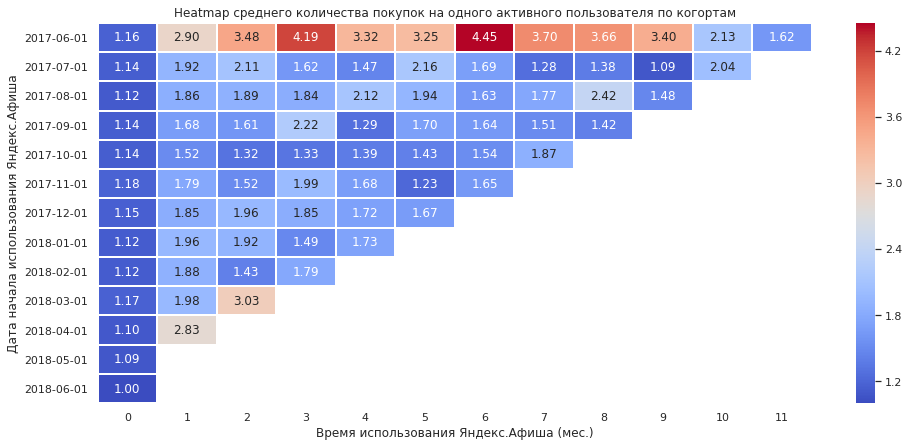

In [42]:
heatmap_func(purchase_pivot, True, '.2f', 'Heatmap среднего количества покупок на одного активного пользователя по когортам')

Первая когорта, у которых Retention Rate выше, чем у всех остальных когорт, в лидерах - в среднем эта когорта делает более 3 заказов в месяц.

Первый месяц все пользователи присматриваются к сервису, а далее уже "разгоняются" и в среднем делают около 2 заказов в месяц.

Апрельская когорта на второй месяц использования ресурса выделилась , а мартовская на третий месяц- оформили практически 3 покупки на клиента, в сравнении с остальными когортами, где, в большинстве, не дотягивает даже до значения в 2 покупки, это выглядит довольно странно, возможно им предложили какой-либо бонус или скидку на заказы в мае 2018

**Расчет средней суммы покупки**<a name="АДПРОДЧЕК"></a>

Создадим копию датафрейма orders, где даты будут не дневные, а месячные и узнаем, какой был средний чек по каждой когорте по месяцам:

In [43]:
# формируем сводную таблицу
orders_monthly = orders.copy()
orders_monthly['purchase_date'] = orders_monthly['purchase_date'].astype('datetime64[M]')
first_orders_month = orders_monthly.groupby('uid').agg({'purchase_date': 'min'}).reset_index()
first_orders_month.columns = ['uid', 'first_purchase_date']

cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_purchase_date', 'n_buyers']

orders_first_orders_month = orders_monthly.merge(first_orders_month, on='uid')
cohorts = (orders_first_orders_month
                                    .groupby(['purchase_date', 'first_purchase_date'])
                                    .agg({'revenue': 'sum', 'uid': 'count'})
                                    .reset_index()
          )
mean_check = cohorts.merge(cohort_sizes, on='first_purchase_date')
time_diff = mean_check['purchase_date'] - mean_check['first_purchase_date']
mean_check['age'] = time_diff / np.timedelta64(1, 'M')
mean_check['age'] = mean_check['age'].round().astype('int')
mean_check['mean_check'] = mean_check['revenue']/mean_check['uid']
mean_check_pivot = mean_check.pivot_table(index="first_purchase_date", columns="age", values="mean_check")

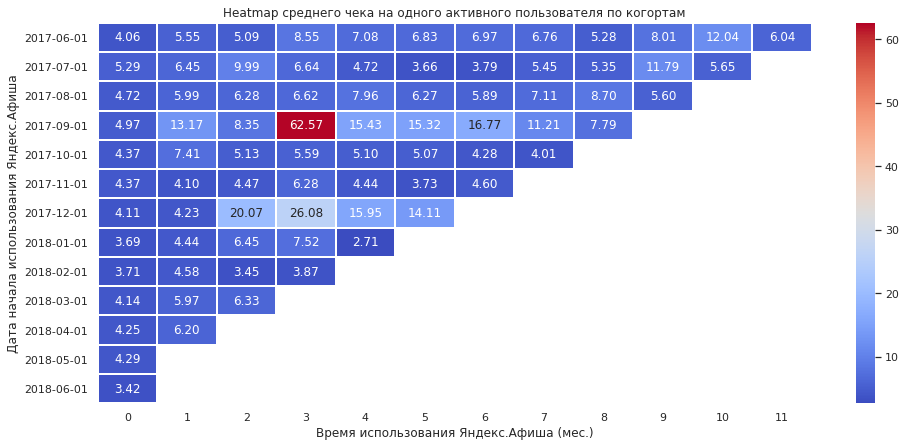

In [44]:
# нарисуем теплoвую карту
heatmap_func(mean_check_pivot, True, '.2f', 'Heatmap среднего чека на одного активного пользователя по когортам')

Средний чек около 8    
Можно отметить несколько аномальных когорт - сентябрьская и декабрьская.  
По ним средний чек после 2-3 первых месяцев был выше 10  
В сентябрьской когорте в декабре был самый высокий показатель среднего чека среди всех когорт - 62,57, возможно кто-то выкупил все билеты на новогоднее мероприятие, так как в этот месяц мы не наблюдали у когорты резкого увеличения числа заказов на одного пользователя.  
В декабрьской когорте тоже было увеличение продаж в феврале-марте 2018, возможно те кто в декабре пришли на сайт в предновогодний период, решили купить билеты в качестве подарков к гендерным праздникам.

**Посмотрим на средний чек без разбиения на когорты**<a name="КОРРЧЕК"></a>

In [45]:
first_visit = visits.groupby('uid').agg({'session_start':'min'})\
                .rename(columns={'session_start':'first_visit_date'})\
                .reset_index()
orders_and_visits = orders.merge(first_visit)
orders_and_visits['purchase_month'] = orders_and_visits['purchase_date'].astype('datetime64[M]')
orders_and_visits['purchase_month'] = orders_and_visits['purchase_month'].dt.strftime('%Y-%m')
mean_purchase_by_month = orders_and_visits.groupby('purchase_month').agg({'revenue': 'mean'}).reset_index()
mean_purchase_by_month['revenue'] = mean_purchase_by_month['revenue'].round(2)

In [46]:
# строим график
fig = px.bar(mean_purchase_by_month, x='purchase_month', y='revenue',title = 'Изменение среднего чека по месяцам',\
             labels={'purchase_month':'Месяц', 'revenue':'Средний чек'}, color='revenue', height=450)
    
fig.show()

Средний чек в пределах 4,5 - 5.  

Самый низкий показатель в июне (период отпусков и дач) и январе (билеты на новогодние представления покупают в основном в декабре).

Самый высокий показатель 5,85 в декабре - покупают билеты на новогодние представления в дни Рождественских каникул

**Расчет показателя LTV**<a name="АДПLTV"></a>

Так как нам не задано значение маржинальности, примем margin_rate = 1 и для этого значения сделаем расчет LTV

In [47]:
# создадим сводную таблицу значения LTV
first_orders_month = orders_monthly.groupby('uid').agg({'purchase_date': 'min'}).reset_index()
first_orders_month.columns = ['uid', 'first_purchase_date']

cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_purchase_date', 'n_buyers']

margin_rate = 1

orders_first_orders_month = orders_monthly.merge(first_orders_month, on='uid')
cohorts = (orders_first_orders_month
                                        .groupby(['purchase_date', 'first_purchase_date'])
                                        .agg({'revenue': 'sum'})
                                        .reset_index()
              )
LTV = cohorts.merge(cohort_sizes, on='first_purchase_date')
LTV['gp'] = LTV['revenue'] * margin_rate
LTV['age'] = (LTV['purchase_date'] - LTV['first_purchase_date']) / np.timedelta64(1, 'M')
LTV['age'] = LTV['age'].round().astype('int')
LTV['ltv'] = LTV['gp'] / LTV['n_buyers']
    
LTV_pivot = LTV.pivot_table(index="first_purchase_date",
                columns="age",
                values="ltv",
                aggfunc='mean')

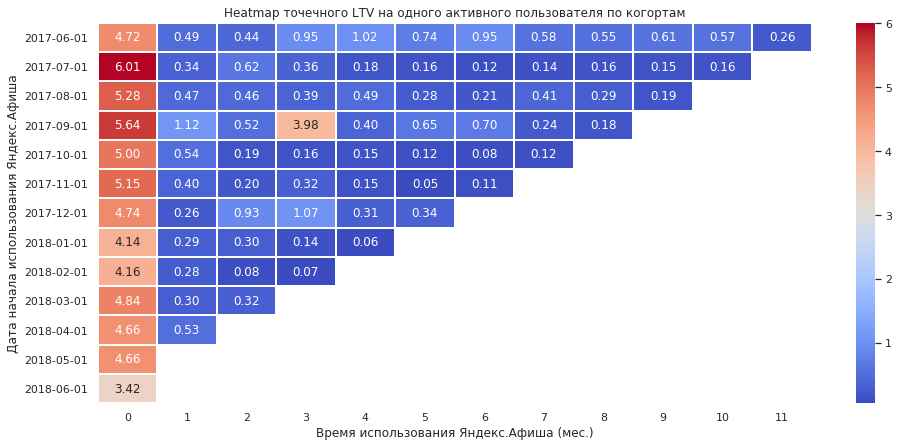

In [48]:
# построим тепловую карту для точечного значения LTV
heatmap_func(LTV_pivot, True, '.2f', 'Heatmap точечного LTV на одного активного пользователя по когортам')

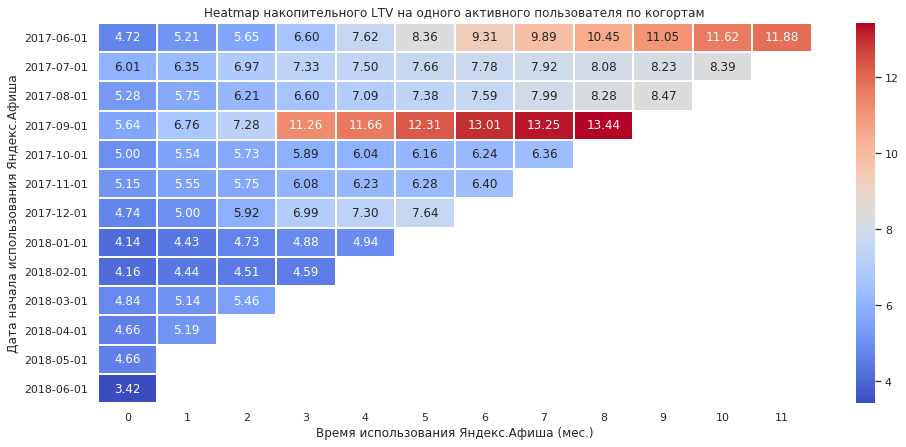

In [49]:
# построим тепловую карту для накопительного значения LTV
heatmap_func(LTV_pivot.cumsum(axis=1), True, '.2f', 'Heatmap накопительного LTV на одного активного пользователя по когортам')

Для более подробного анализа был выведен как "точечный" LTV (значение LTV в каждый отдельный месяц - 1 график), так и накопительный (2 график).   
Можно заметить, что первые когорты (2017 года) были более "качественные", чем последующие - их накопительный LTV заметно выше, чем по остальным когортам.
Опять отметим, что первая когорта самая стабильная - практически в каждом месяце она показывала лучший результат по LTV среди всех когорт. Вызвано это тем, что именно эта когорта показывает лучший показатель Retention Rate - как относительный, так и абсолютный.  
У сентябрьской когорты был всплеск значения LTV на 3ий месяц её жизни (в декабре) - практически до 4, вывело ее в лидеры по накопительному LTV среди всех когорт (это следствие нашего предполагаемого большого новогоднего заказа)  

**Построим график показателя LTV в разрезе рекламных источников**<a name="КОРРLTV"></a>

In [50]:
# добавим время первого захода
visits_min1 = visits.groupby(['uid']).agg({'session_start' : 'min'}).reset_index()
visits_min1.name = 'start_ts_min'
visits_new = visits.merge(visits_min1, on='uid', how = 'left')
 
# добавим время первого заказа
orders_min1 = orders.groupby(['uid']).agg({'purchase_date': 'min'}).reset_index()
orders_min1.columns = ['uid', 'buy_ts_min']
visits_new = visits_new.merge(orders_min1, on='uid', how = 'left')
 
# добавим первый источник
visits_tr = (visits
             .sort_values(by = 'session_start')
             .groupby('uid')
             .agg({'source_id': 'first'})
             .reset_index())
 
visits_tr.columns = ['uid', 'source_first']
visits_new = visits_new.merge(visits_tr, on='uid', how = 'left')
 
# переведем дату первой покупки в месяц
visits_new['buy_ts_min_month'] = visits_new['buy_ts_min'].astype('datetime64[M]')
 
# подготовим табличку с прибылью

first_visits = visits.groupby('uid').first().reset_index()
uid_visits=first_visits.groupby('uid')['source_id'].min().reset_index()
orders_source = orders.merge(uid_visits, on='uid')
orders_source['f_month'] = orders_source['purchase_date'].astype('datetime64[M]')
revenue_gr = orders_source.groupby(['source_id', 'f_month']).agg({'revenue' :'sum'}).reset_index()
 
# подготовим табличку с визитами
visits_grup = (visits_new
               .groupby(['source_first', 'buy_ts_min_month'])
               .agg({'uid': 'nunique'})
               .reset_index())
 
# получим табличку с расчетом LTV
LTV_table = revenue_gr.merge(visits_grup, left_on = ['source_id', 'f_month'], right_on = ['source_first', 'buy_ts_min_month'])
LTV_table['ltv'] = (LTV_table['revenue'] / LTV_table['uid']).round(2)
LTV_table = LTV_table[['source_id', 'f_month', 'uid', 'revenue', 'ltv']]
LTV_table['ltv_cumsum'] = LTV_table.groupby('source_id').agg({'ltv' :'cumsum'})

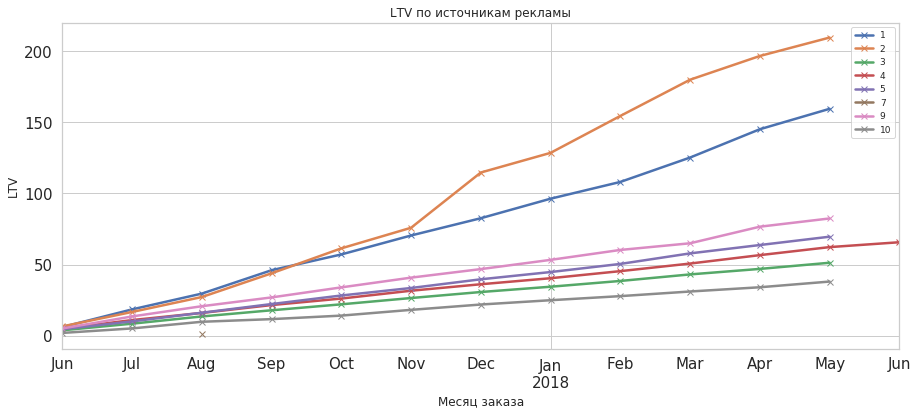

In [51]:
#строим график
ax = plt.gca()

sources = LTV_table['source_id'].unique().tolist()
for source in sources:
    plot = LTV_table.query('source_id == @source')\
    .plot(x='f_month', y='ltv_cumsum', style='x-', kind='line', fontsize=15, linewidth=2.5,\
          label=source, ax=ax, figsize=(15,6), title = 'LTV по источникам рекламы')\
    .set(xlabel = 'Месяц заказа', ylabel = 'LTV');
  

    
    plt.legend(sources)
ax.legend(prop={'size': 9}, bbox_to_anchor=(1.0, 1.0));

На графике видно, что интенсивнее растет LTV покупателей привлеченных рекламным каналом №2 и рекламным каналом №1

**Вывод:**  
* в среднем люди оформляют заказ в течении 16 минут, после первого посещения сайта, т.е. заходят на сайт целенаправленно за билетами  

* в первый месяц делают чаще только 1 заказ, в дальнейшем средний покупатель далает уже до 2 заказов в месяц  

* в первый месяц средний чек 3-4, с увеличением числа заказов, средний чек увеличивается до 8  

* первые когорты (сформированные в 2017 году) показывают более интенсивный рост LTV, когорты 2018 года растут медленнее  

* самый интенсивный рост LTV у покупателей привлеченных рекламными каналами №№ 1 и 2

## 5. Анализ данных по маркетингу. <a name="МАРК"></a>

Ответим на следующие вопросы:

* Сколько денег потратили? Всего / на каждый источник / по времени
* Сколько стоило привлечение одного покупателя из каждого источника?
* На сколько окупились расходы? (ROI)

Работать будем с датафреймами costs (для анализа затрат) и orders (для анализа выручки).

**Расчет суммарной выручки и суммарных затрат на маркетинг**<a name="МАРКСУМ"></a>

Сначала подготовим данные и создадим датафрейм с 2 строками и 1 столбцом, где будут указаны суммарная выручка и суммарные затраты:

In [52]:
costs_copy = costs.copy()
costs_copy['date'] = costs_copy['date'].values.astype('datetime64[M]') 
costs_grouped = costs_copy.groupby('date').agg({'costs': 'sum'})

In [53]:
orders_grouped = orders_monthly.groupby('purchase_date').agg({'revenue': 'sum'})

In [54]:
data = {'summary': [round(orders_grouped.sum().values[0], 2),round(costs_grouped.sum().values[0], 2)]}
rev_costs = pd.DataFrame(data=data, index=['revenue', 'costs'])

Посмотрим как выглядит соотношение суммарных затрат и выручки на круговой диаграмме

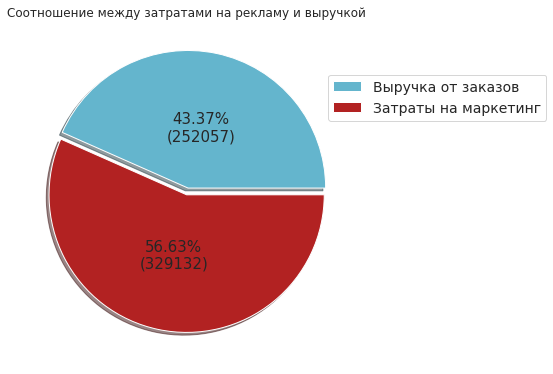

In [55]:
summary = rev_costs.values.sum()
def func_pct(pct):
    value = float(pct/100.*summary)
    return "{:.2f}%\n({:.0f})".format(pct, value)

explode = (0.05, 0)  # сектор 'ultra' немного выдвинем

ax_pie = rev_costs.plot(kind='pie', y='summary', fontsize=15, use_index=False, shadow=True, explode=explode,
                        title = 'Соотношение между затратами на рекламу и выручкой', pctdistance=0.45, figsize=(15,5), 
                        autopct=lambda pct: func_pct(pct), colors=['c', 'firebrick'], labels=None)

plt.tight_layout(pad=0)

legend = ax_pie.legend(['Выручка от заказов', 'Затраты на маркетинг'], bbox_to_anchor=(0.89,0.87), prop={'size':14})
y_label = ax_pie.set_ylabel('')

На сегодняшний день компания работает в убыток: затраты на маркетинг превышают выручку  
Возможно, что вложения в рекламу в более длительном периоде времени окупятся, т.к. пользователи новых когорт ещё не имели достаточно времени показать нам свои результаты по выручке.

**Расчет суммарной выручки по месяцам по когортам**<a name="МАРКСУМВЫР"></a>

Посмотрим, какой "вклад" выручку вносит каждая когорта каждый месяц:

In [56]:
first_orders_month = orders_monthly.groupby('uid').agg({'purchase_date': 'min'}).reset_index()
first_orders_month.columns = ['uid', 'first_purchase_date']

cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_purchase_date', 'n_buyers']

orders_first_orders_month = orders_monthly.merge(first_orders_month, on='uid')
cohorts = (orders_first_orders_month
                                    .groupby(['purchase_date', 'first_purchase_date'])
                                    .agg({'revenue': 'sum'})
                                    .reset_index()
          )
orders_area_plot = cohorts.merge(cohort_sizes, on='first_purchase_date')
time_diff = orders_area_plot['purchase_date'] - orders_area_plot['first_purchase_date']
orders_area_plot['age'] = time_diff / np.timedelta64(1, 'M')
orders_area_plot['age'] = orders_area_plot['age'].round().astype('int')

orders_pivot = orders_area_plot.pivot_table(index="first_purchase_date", columns="age", 
                                            values="revenue", aggfunc="sum")


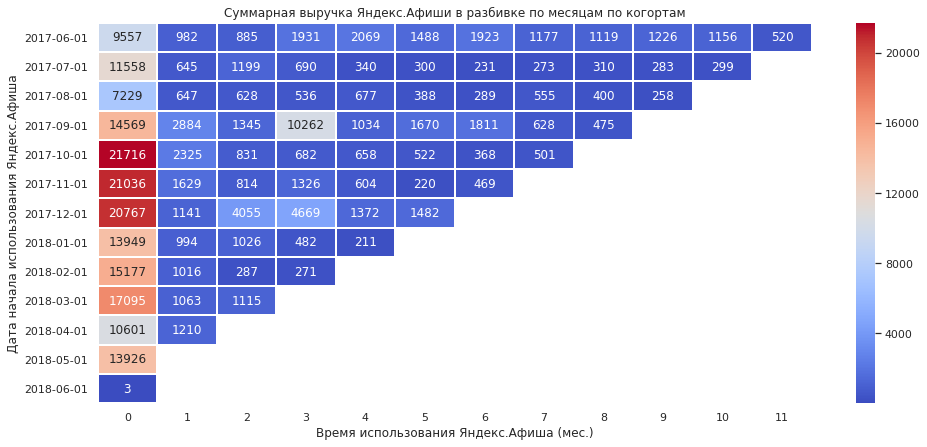

In [57]:
heatmap_func(orders_pivot, True, '.0f', 'Суммарная выручка Яндекс.Афиши в разбивке по месяцам по когортам')

Каждая когорта вносит максимальный вклад в выручку в первый (нулевой) месяц своего присутствия, на следующий месяц вклад сильно снижается и потом постепенно стремится к нулю.   
Что и следовало ожидать, учитывая, что показатель Retention Rate ведёт себя так же.
Сентябрьская когорта имеет всплеск в декабре 2018 (новогодний заказ).   
У декабрьской когорты тоже есть небольшой всплеск в феврале-марте 2018. 

**Расчет ежемесячных затрат на маркетинг по источникам рекламы**<a name="МАРКЗИ"></a>

Посмотрим на затраты на рекламу по времени в разбивке по рекламным каналам:

In [58]:
# группируем данные
df_to_plot_costs_by_source = (costs
                              .groupby(['source_id', 'date'])['costs']
                              .sum()
                              .reset_index()
                             )
df_to_plot_costs_by_source['date'] = df_to_plot_costs_by_source['date'].astype('datetime64[M]')
df_to_plot_costs_by_source = df_to_plot_costs_by_source.groupby(['source_id', 'date'])['costs'].sum().reset_index()


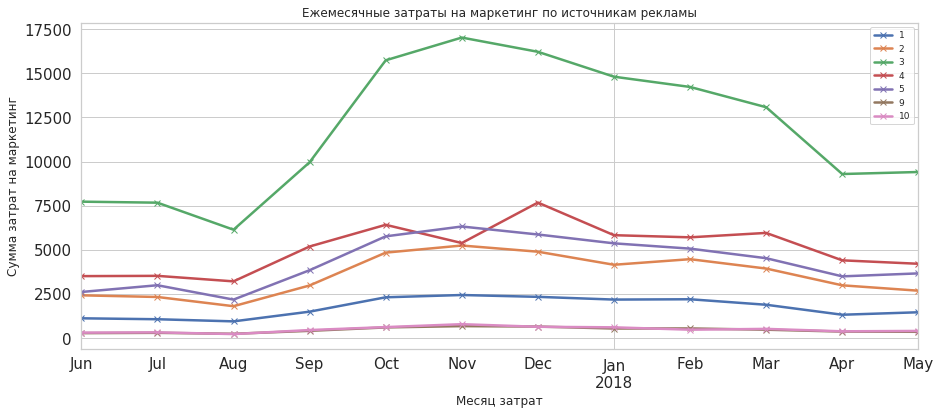

In [59]:
#строим график
ax = plt.gca()

sources = df_to_plot_costs_by_source['source_id'].unique().tolist()
for source in sources:
    plot = df_to_plot_costs_by_source.query('source_id == @source')\
    .plot(x='date', y='costs', style='x-', kind='line', fontsize=15, linewidth=2.5,\
          label=source, ax=ax, figsize=(15,6), title = 'Ежемесячные затраты на маркетинг по источникам рекламы')\
    .set(xlabel = 'Месяц затрат', ylabel = 'Сумма затрат на маркетинг');
  

    
    plt.legend(sources)
ax.legend(prop={'size': 9}, bbox_to_anchor=(1.0, 1.0));

Начиная с августа 2017г. вложения в рекламу начали увеличиваться. 

В ноябре того же года они достигли пика практически по всем рекланым каналам. В результате мы имели взлёт количества посетителей сайта в "Чёрную пятницу"

Самый активный период инвестирования денег в рекламные компании - с октября 2017г. по март 2018г. (включительно).

В остальные периоды активность по заказу рекламы есть, но уже значительно ниже.

Самый "дорогой" канал №3, в него вкладывают больше всего денег

**Расчет затрат, выручки и количества привлеченных пользователей и покупателей в разбивке по источникам рекламы**<a name="МАРКОИ"></a>

Исследуем метрики (суммарные показатели за весь рассматриваемый год):

* сумма вложений в рекламный канал;
* суммарная выручка;
* суммарное количество уникальных посетителей, который привлек данный канал;
* суммарное количество уникальных покупателей.

In [60]:
# покупатели по каналам
visits_sorted = visits.sort_values(by='session_start')

# затраты по каналам
costs_per_source = costs.groupby('source_id').agg({'costs': 'sum'})

# выручка по каналам
first_source_per_user = visits_sorted.groupby('uid').agg({'source_id': 'first'})
client_per_source = orders.merge(first_source_per_user, on='uid')
client_per_source = client_per_source.groupby('source_id').agg({'uid': 'nunique'})

# уникальные пользователи по каналам
uid_per_source = visits_sorted.groupby('source_id').agg({'uid': 'nunique'})

rev_per_source = orders.merge(first_source_per_user, on='uid')
rev_per_source = rev_per_source.groupby('source_id').agg({'revenue': 'sum'})

rev_uid_costs_per_source = pd.concat([costs_per_source, rev_per_source, 
                                      uid_per_source, client_per_source],axis=1).fillna(0)
rev_uid_costs_per_source = rev_uid_costs_per_source.reset_index()
rev_uid_costs_per_source.columns = ['source_id', 'costs', 'revenue', 'uid', 'clients']

In [61]:
rev_uid_costs_per_source = rev_uid_costs_per_source.reset_index()

Посмотрим на графики, исключив 6 и 7 каналы рекламы, так как на них нет расходов и , как следствие, с двух каналов 1 покупатель

,index,source_id,costs,revenue,uid,clients
0,0,1,20833.27,31090.55,18999,2899.0
1,1,2,42806.04,46923.61,26245,3506.0
2,2,3,141321.63,54511.24,74756,10473.0
3,3,4,61073.60,56696.83,83525,10296.0
4,4,5,51757.10,52624.02,56974,6931.0
5,5,6,0.00,0.00,6,0.0
6,6,7,0.00,1.22,34,1.0
7,7,9,5517.49,5759.40,9264,1088.0
8,8,10,5822.49,4450.33,8067,1329.0


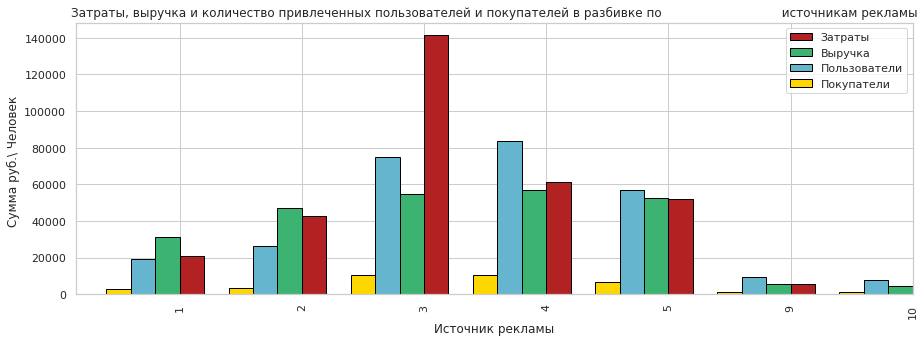

In [62]:
ax = plt.gca()

rev_uid_costs_per_source.query('source_id not in (6, 7)').plot(x='source_id', y='costs', kind='bar',figsize=(15,5), title = \
                              'Затраты, выручка и количество привлеченных пользователей и покупателей в разбивке по \
                              источникам рекламы', ax=ax, ec='black', width=0.2, position=0, color = 'firebrick')
rev_uid_costs_per_source.query('source_id not in (6, 7)').plot(x='source_id', y='revenue', kind='bar',ax=ax, ec='black',\
                                                               width=0.2, position=1, color = 'mediumseagreen')
rev_uid_costs_per_source.query('source_id not in (6, 7)').plot(x='source_id', y='uid', kind='bar',ax=ax, ec='black', \
                                                               width=0.2, position=2, color = 'c')
rev_uid_costs_per_source.query('source_id not in (6, 7)').plot(x='source_id', y='clients', kind='bar', ax=ax, ec='black', \
                                                               width=0.2, position=3, color = 'gold')
ax.set_xlabel('Источник рекламы')
ax.set_ylabel('Сумма руб.\ Человек ')
display(rev_uid_costs_per_source)
plt.legend(['Затраты', 'Выручка', 'Пользователи', 'Покупатели']);

В рекламный канал №3 делается больше всего вложений (более 50% от суммы всех вложений в рекламу). Тем не менее, этот канал не является абсолютным лидером по размеру выручки.  
Канал №4 с намного более меньшим рекламным бюджетом дает нам даже немного чуть большую выручку, чем канал №3. С чуть меньшими рекламными затратами, но с примерно схожими показателями по выручке идут канал №2 и №5.  
По количеству покупателей лидером всё же является канал №3, за ним следом идет канал №4. Учитывая то, что по каналу №4 выручка чуть выше, можно сказать, что средний чек клиента, привлеченного каналом №4, выше, чем привлеченного каналом №3.  
Также есть совсем скромные каналы №9 и №10.  
Тем не менее, по этому графику мы не можем делать никаких выводов по вопросу окупаемости каждого из каналов. Для этого необходимо посчитать ROMI, что мы и сделаем далее.  

**Стоимость привлечения одного покупателя из каждого источника рекламы**<a name="МАРКСП"></a>

Выведем информацию по стоимости привлечения одного клиента по каждому из каналов рекламы:

In [63]:
rev_uid_costs_per_source['price_for_client'] = rev_uid_costs_per_source['costs']/rev_uid_costs_per_source['clients']
rev_uid_costs_per_source['price_for_client'] = rev_uid_costs_per_source['price_for_client'].round(2)
rev_uid_costs_per_source[['source_id', 'price_for_client']].sort_values(by = 'price_for_client', ascending=False)

,source_id,price_for_client
2,3,13.49
1,2,12.21
4,5,7.47
0,1,7.19
3,4,5.93
7,9,5.07
8,10,4.38
6,7,0.00
5,6,NaN


In [64]:
# построим график
fig = px.bar(rev_uid_costs_per_source[['source_id', 'price_for_client']], x='source_id', y='price_for_client', \
             title="Стоимость привлечения одного покупателя из каждого источника рекламы", \
             labels={'source_id':'Источник рекламы', 'price_for_client': 'Стоимость привлечения покупателя'}, \
             height=400, color='price_for_client')
fig.show()

Ожидаемо, что лидер по дороговизне привлечения одного пользователя - 3 канал. За ним идет 2 канал, но он себя в окупает, в отличие от идущих за ним 4 и 5.

**Построим график показателя CAC в разрезе рекламных источников**<a name="КОРРCAC"></a>

In [65]:
# добавим время первого захода
visits_min1 = visits.groupby(['uid']).agg({'session_start' : 'min'}).reset_index()
visits_min1.name = 'start_ts_min'
visits_new = visits.merge(visits_min1, on='uid', how = 'left')
 
# добавим время первого заказа
orders_min1 = orders.groupby(['uid']).agg({'purchase_date': 'min'}).reset_index()
orders_min1.columns = ['uid', 'buy_ts_min']
visits_new = visits_new.merge(orders_min1, on='uid', how = 'left')
 
# добавим первый источник
visits_tr = (visits
             .sort_values(by = 'session_start')
             .groupby('uid')
             .agg({'source_id': 'first'})
             .reset_index())
 
visits_tr.columns = ['uid', 'source_first']
visits_new = visits_new.merge(visits_tr, on='uid', how = 'left')
 
# переведем дату первой покупки в месяц
visits_new['buy_ts_min_month'] = visits_new['buy_ts_min'].astype('datetime64[M]')
 
# подготовим табличку с костами
costs['f_month'] = costs['date'].astype('datetime64[M]')
costs_gr = costs.groupby(['source_id', 'f_month']).agg({'costs' :'sum'}).reset_index()
 
# подготовим табличку с визитами
visits_grup = (visits_new
               .groupby(['source_first', 'buy_ts_min_month'])
               .agg({'uid': 'nunique'})
               .reset_index())
 
# получим табличку с расчетом CAC
CAC_table = costs_gr.merge(visits_grup, left_on = ['source_id', 'f_month'], 
               right_on = ['source_first', 'buy_ts_min_month'])
CAC_table['cac'] = (CAC_table['costs'] / CAC_table['uid']).round(2)
CAC_table = CAC_table[['source_first', 'buy_ts_min_month', 'costs', 'cac']]

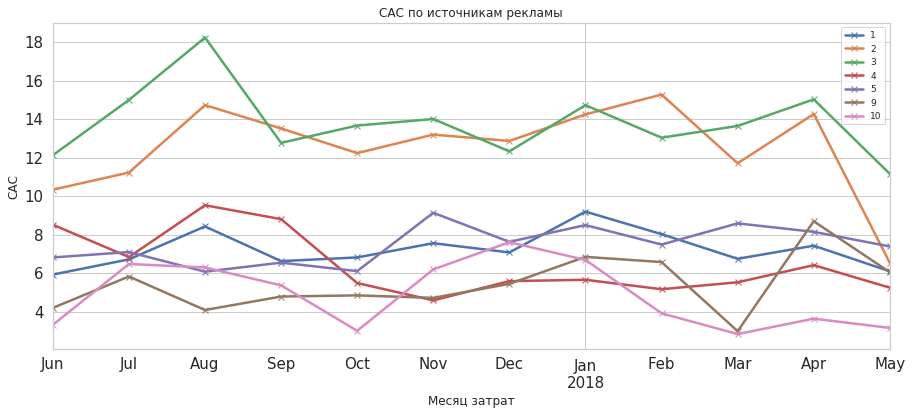

In [66]:
#строим график
ax = plt.gca()

sources = CAC_table['source_first'].unique().tolist()
for source in sources:
    plot = CAC_table.query('source_first == @source')\
    .plot(x='buy_ts_min_month', y='cac', style='x-', kind='line', fontsize=15, linewidth=2.5,\
          label=source, ax=ax, figsize=(15,6), title = 'CAC по источникам рекламы')\
    .set(xlabel = 'Месяц затрат', ylabel = 'CAC');
  

    
    plt.legend(sources)
ax.legend(prop={'size': 9}, bbox_to_anchor=(1.0, 1.0));

Самые "дорогие" клиенты приходят к нам из рекламных источников №№ 3 и 2

**Расчет ROMI**<a name="МАРКРОМИ"></a>

In [67]:
# LTV по каналам рекламы
def get_LTV_pivot_by_source(source, margin_rate=1):
    visits_sorted = visits.sort_values(by='session_start')
    first_source_per_user = (visits_sorted
                                 .groupby('uid')
                                 .agg({'source_id': 'first'})
                                 .reset_index()
                            )
    chosen_buyers = first_source_per_user[first_source_per_user['source_id'] == source]
    visits_by_source = orders_monthly.merge(chosen_buyers, on='uid')
    mean_check = round(visits_by_source['revenue'].mean(), 2)
    visits_by_source['purchase_date'] = visits_by_source['purchase_date'].astype('datetime64[M]')
    
    first_orders_month = visits_by_source.groupby('uid').agg({'purchase_date': 'min'}).reset_index()
    first_orders_month.columns = ['uid', 'first_purchase_date']

    cohort_sizes = first_orders_month.groupby('first_purchase_date').agg({'uid': 'nunique'}).reset_index()
    cohort_sizes.columns = ['first_purchase_date', 'n_buyers']
    orders_first_orders_month = visits_by_source.merge(first_orders_month, on='uid')
    cohorts = (orders_first_orders_month
                                    .groupby(['purchase_date', 'first_purchase_date'])
                                    .agg({'revenue': 'sum'})
                                    .reset_index())
    LTV = cohorts.merge(cohort_sizes, on='first_purchase_date')
    LTV['gp'] = LTV['revenue'] * margin_rate
    LTV['age'] = (LTV['purchase_date'] - LTV['first_purchase_date']) / np.timedelta64(1, 'M')
    LTV['age'] = LTV['age'].round().astype('int')
    LTV['ltv'] = LTV['gp'] / LTV['n_buyers']
    return LTV
    
    
# ROMI по каналам рекламы    
def get_ROMI_pivot_by_source(LTV, source, costs=costs, margin_rate=1):
    costs_cac = costs[costs['source_id'] == source].copy()
    costs_cac['date'] = costs_cac['date'].astype('datetime64[M]')
    all_costs = costs_cac.groupby('date')['costs'].sum().to_frame().reset_index()
    sum_costs = round(all_costs.sum().values[0], 2)
    final_cac = LTV.merge(all_costs, left_on='first_purchase_date', right_on='date')
    final_cac['cac'] = final_cac['costs']/final_cac['n_buyers']
    final_cac['romi'] = final_cac['ltv']/final_cac['cac']
    romi_pivot = final_cac.pivot_table(index='first_purchase_date', columns='age',
                                     values='romi').round(2)
    romi_pivot_cumsum = romi_pivot.cumsum(axis=1).round(2)
    return romi_pivot_cumsum

In [68]:
# визуализация ROMI по каналам рекламы 
def final_ROMI_source_output(margin_rate=1):
    sources = [1, 2, 3, 4, 5, 9]
    tabs = list()

    for source in sources:
        LTV = get_LTV_pivot_by_source(source, margin_rate=margin_rate)
        romi_pivot_cumsum = get_ROMI_pivot_by_source(LTV, source)
        heatmap = heatmap_func(romi_pivot_cumsum, True, '.2f', 'Накопленный ROMI по когортам клиентов из источника рекламы №{}'\
                               .format(source))
    return  heatmap      

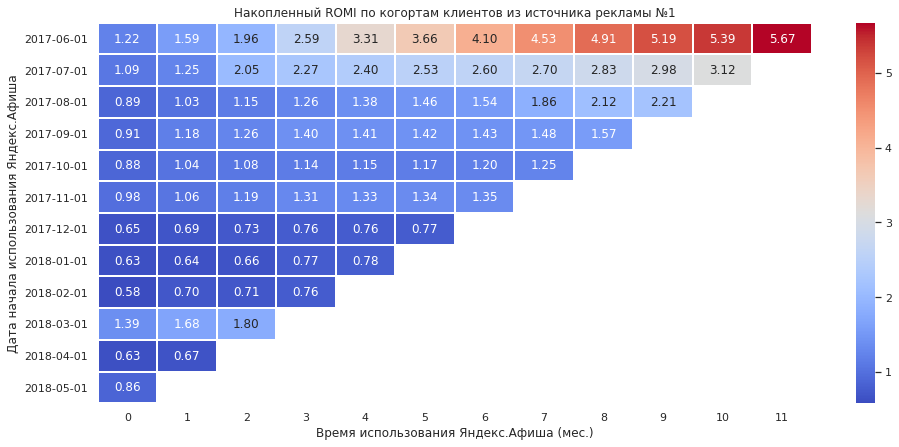

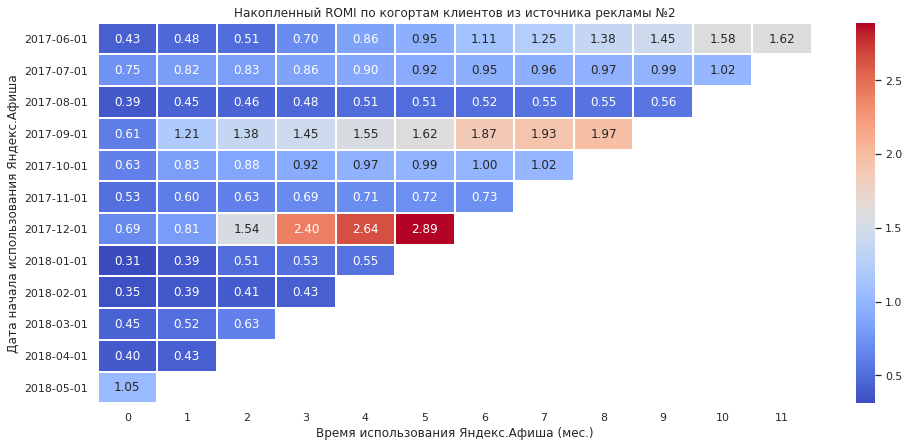

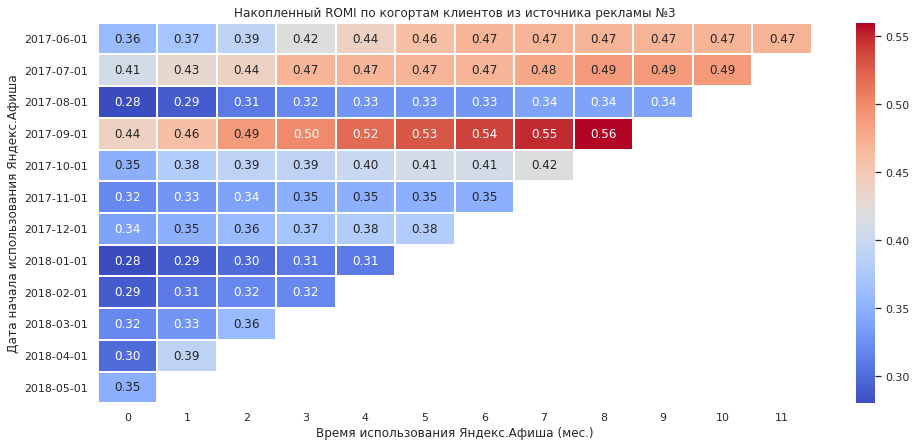

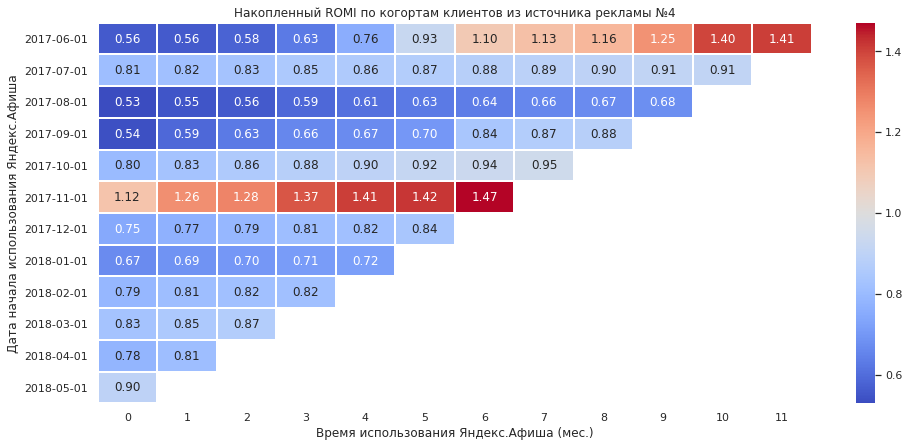

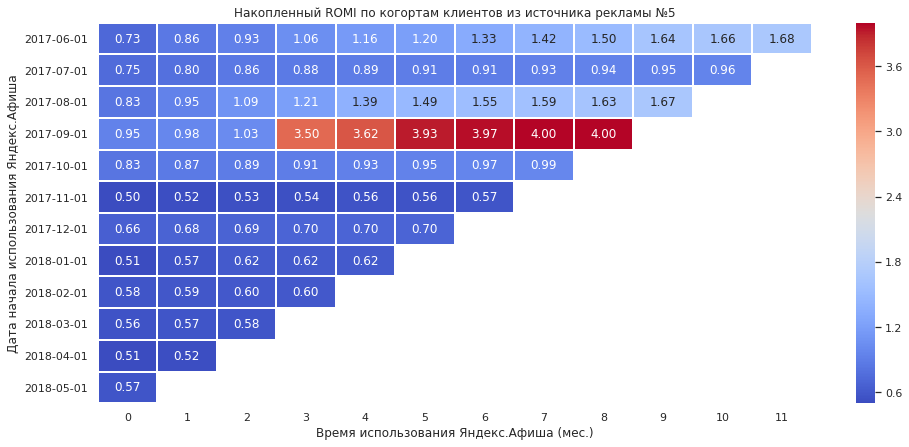

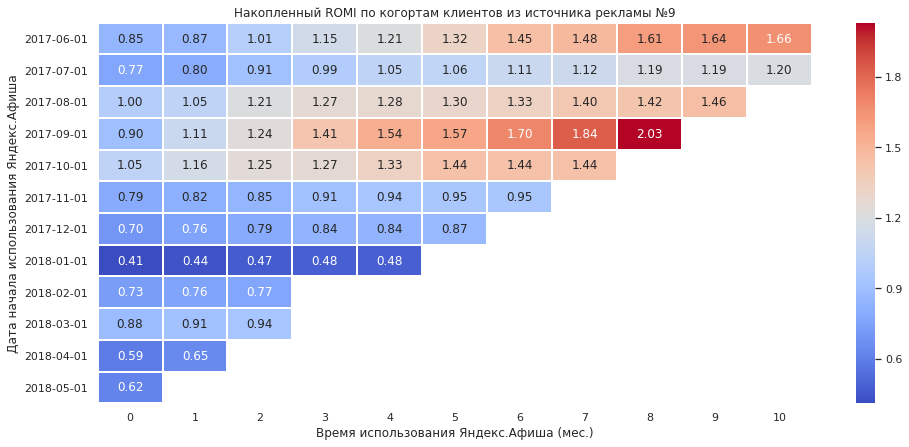

In [69]:
final_ROMI_source_output(margin_rate=1)

**Построим график показателя ROMI в разрезе рекламных источников**<a name="КОРРROMI"></a>

In [70]:
# на основании рассчитанных CAC и LTV рассчитаем ROMI
ROMI_table = LTV_table.merge(CAC_table, left_on = ['source_id', 'f_month'], right_on = ['source_first', 'buy_ts_min_month'])
ROMI_table['romi'] = (ROMI_table['ltv_cumsum'] / ROMI_table['cac']).round(2)
ROMI_table=ROMI_table[['source_id', 'f_month', 'uid', 'revenue', 'costs', 'ltv_cumsum', 'cac', 'romi']]

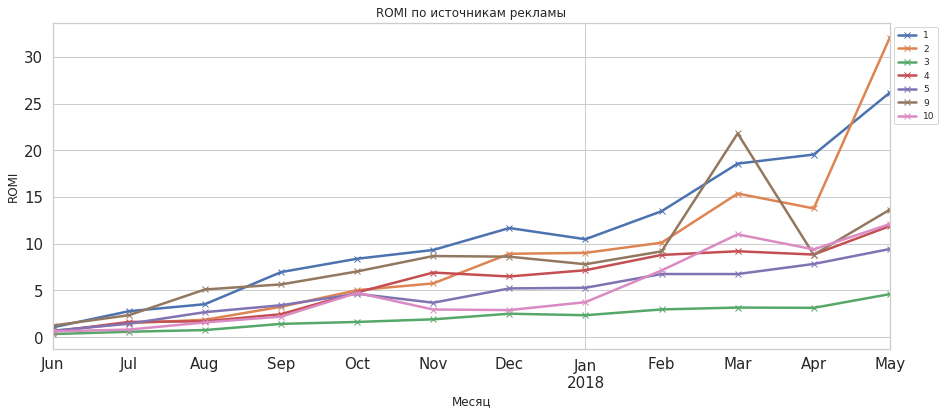

In [71]:
#строим график
ax = plt.gca()

sources = ROMI_table['source_id'].unique().tolist()
for source in sources:
    plot = ROMI_table.query('source_id == @source')\
    .plot(x='f_month', y='romi', style='x-', kind='line', fontsize=15, linewidth=2.5,\
          label=source, ax=ax, figsize=(15,6), title = 'ROMI по источникам рекламы')\
    .set(xlabel = 'Месяц', ylabel = 'ROMI');
   
    plt.legend(sources)
ax.legend(prop={'size': 9}, bbox_to_anchor=(1.0, 1.0));

Самый высокий показатель окупаемости маркетинговых затрат у каналов №№ 1 и 2

In [72]:
# посмотрим на абсолютную разницу между затратами на рекламу и выручкой по каналам
rev_uid_costs_per_source['payback'] = rev_uid_costs_per_source['revenue'] - rev_uid_costs_per_source['costs']
rev_uid_costs_per_source.query('source_id not in (6, 7)')

,index,source_id,costs,revenue,uid,clients,price_for_client,payback
0,0,1,20833.27,31090.55,18999,2899.0,7.19,10257.28
1,1,2,42806.04,46923.61,26245,3506.0,12.21,4117.57
2,2,3,141321.63,54511.24,74756,10473.0,13.49,-86810.39
3,3,4,61073.60,56696.83,83525,10296.0,5.93,-4376.77
4,4,5,51757.10,52624.02,56974,6931.0,7.47,866.92
7,7,9,5517.49,5759.40,9264,1088.0,5.07,241.91
8,8,10,5822.49,4450.33,8067,1329.0,4.38,-1372.16


* Канал №1 - на рассматриваемом периоде окупился. Выглядит очень уверенно - лучший канал с точки зрения окупаемости. Самый высокий показатель ROMI. Большая часть когорт окупилась в первые 2 месяца, остальные уже близки к окупаемости.  
* Канал №2 - тоже окупился, но почти на грани. Половина когорт уже окупилась. Есть надежда, что остальные тоже выйдут в "плюс".   
* Канал №3 - самый затратный и самый убыточный. Ни одна из когорт не приблизилась к окупаемости.  
* Канал №4 - тоже отработал исследуемый период в убыток, но 2 когорты уже окупились, а показатели остальных стремятся к 1, так что вполне возможно в ближайшей перспективе он окупится  
* Канал №5 - канал на рассматриваемом периоде окупился, ROMI у первых 5 когорт или близок к единице или уже выше. Но по остальным, более поздним, когортам он растет гораздо медленнее, думаю не стоит рассматривать его, как перспективный  
* Канал №9 - самый скромный по вложениям, но тем не менее он окупился и ROMI по большинству когорт около 1 или выше и по остальным когортам уверенно растет  
* Канал №10 -  так же достаточно скромный по вложениям, но не окупается и бесперспективный  

**Вывод:**  
*  в рассматриваемом периоде суммарные затраты на маркетинг(329132) превышают суммарную выручку от заказов (252057)  
* каждая когорта вносит максимальный вклад в выручку в первый (нулевой) месяц своего присутствия, на следующий месяц вклад сильно снижается и потом постепенно стремится к нулю.  
* самый активный период инвестирования денег в рекламные компании - с октября 2017г. по март 2018г. (включительно). Самый "дорогой" канал №3, в него вкладывают больше всего денег  
* канал №4 с намного более меньшим рекламным бюджетом дает нам даже немного чуть большую выручку, чем канал №3. С чуть меньшими рекламными затратами, но с примерно схожими показателями по выручке идут канал №2 и №5.   
* канал №1 - лучший канал с точки зрения окупаемости. Самый высокий показатель ROMI. Большая часть когорт окупилась в первые 2 месяца, остальные уже близки к окупаемости.  

## 6. Анализ данных в разрезе категории устройства пользователя. <a name="УСТР"></a>

**Детализация посещений сайта по категории устройства пользователя**<a name="УСТРПОС"></a>

Для этого обратимся к датафрейму visits и построим круговую диаграмму:

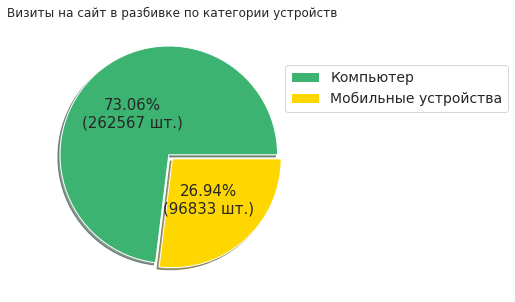

In [73]:
visits_by_device = visits.groupby('device').agg({'uid': 'count'})
summary = visits_by_device.values.sum()

def func_pct(pct):
    value = float(pct/100.*summary)
    return "{:.2f}%\n({:.0f} шт.)".format(pct, value)

explode = (0.05, 0)

ax_pie = visits_by_device.plot(kind='pie', y='uid', fontsize=15, use_index=False, shadow=True, explode=explode,
                        title = 'Визиты на сайт в разбивке по категории устройств', pctdistance=0.5, figsize=(15,4), 
                        autopct=lambda pct: func_pct(pct), colors=['mediumseagreen', 'gold'], labels=None)

plt.tight_layout(pad=0)

legend = ax_pie.legend(['Компьютер', 'Мобильные устройства'], bbox_to_anchor=(0.89,0.87), prop={'size':14})
y_label = ax_pie.set_ylabel('')

Приблизительно 73% посещений Яндекс.Афиша совершены с компьютера.   
Учитывая нынешнее время, 27 % посещаемости с мобильных устройств - довольно слабый показатель. 
Вероятно в 2017-2018 году у Яндекс.Афиши не было мобильного приложения, а мобильная версия сайта была не слишком удобной в использовании.  
Так же такое распределение может быть связано с особенностями рынка, чаще всего билеты на мероприятия покупают или в рабочее время с рабочего компьютера  или из дома - намного удобнее выбирать место в зрительном зале с компьютера, чем с телефона, такие покупки совершаются не на ходу, а в спокойной обстановке.

**Расчет выручки в разбивке по категории устройства**<a name="УСТРВЫР"></a>

In [74]:
visits_by_source = visits.query('session_start == first_visit')
revenue_by_device = orders.merge(visits_by_source, on='uid', how='inner')
revenue_by_device['purchase_month'] = revenue_by_device['purchase_date'].astype('datetime64[M]')
revenue_by_device['purchase_month'] = revenue_by_device['purchase_month'].dt.strftime('%Y-%m')
revenue_by_device = revenue_by_device.groupby(['purchase_month', 'device']).agg({'revenue':'sum'}).reset_index()
revenue_by_device.head()

,purchase_month,device,revenue
0,2017-06,desktop,8321.37
1,2017-06,touch,1236.12
2,2017-07,desktop,10251.79
3,2017-07,touch,2287.68
4,2017-08,desktop,7258.59


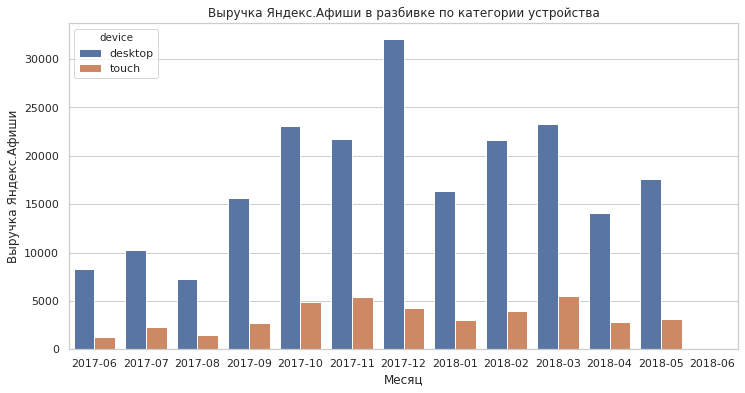

In [75]:
plt.figure(figsize = (12, 6))
ax = sns.barplot(x="purchase_month", y="revenue", hue="device", data=revenue_by_device)
plt.title('Выручка Яндекс.Афиши в разбивке по категории устройства')
ax.set_xlabel('Месяц')
ax.set_ylabel('Выручка Яндекс.Афиши')
plt.show()

Как и следовало ожидать: основную выручку по всем каналам приносят пользователи компьютеров, декабрь самый прибыльный месяц.

**Расчет коэффициента удержания в разбивке по категории устройства**<a name="УСТРРР"></a>

Посмотрим на коэффициент удержания в разрезе категории устройств пользователя

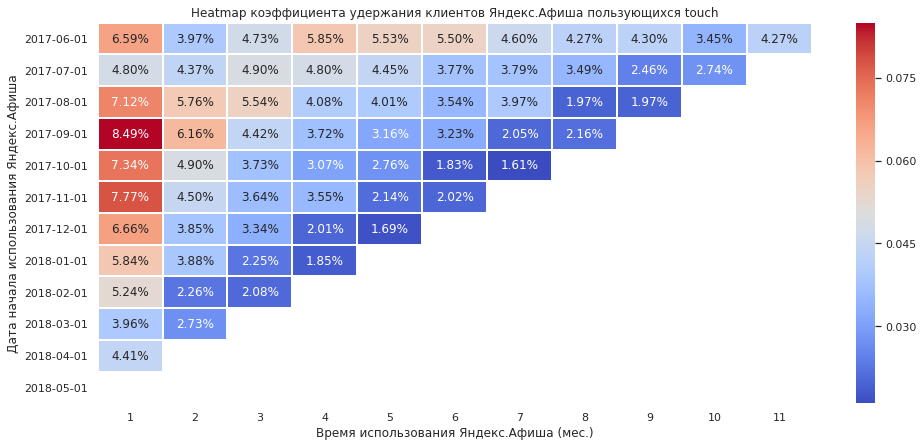

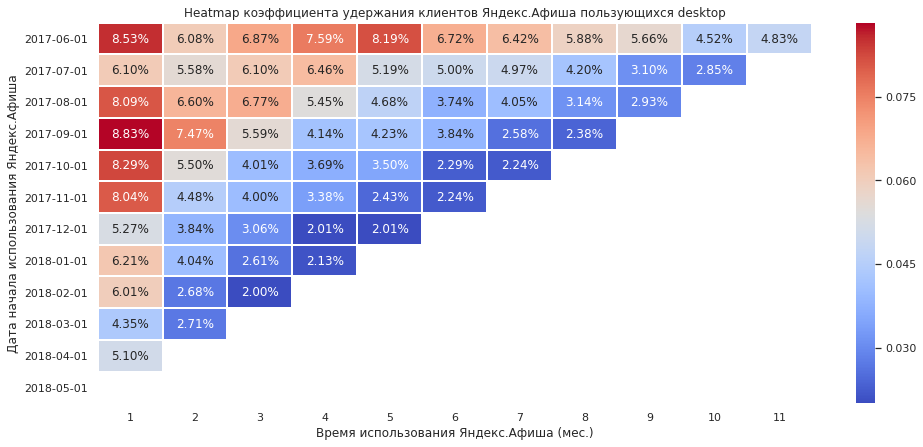

In [76]:
devices = visits['device'].unique().tolist()
for device in devices:
    visits['lifetime'] = (visits['session_month'] - visits['first_visit_month']) / np.timedelta64(1, 'M')
    visits['lifetime'] = visits['lifetime'].round().astype('int')
    cohort_visits_device = visits.query('device == @device').groupby(['first_visit_month', 'lifetime'])\
    .agg({'uid': 'nunique'}).reset_index()
    uid_first_device = cohort_visits_device[cohort_visits_device['lifetime'] == 0][['first_visit_month', 'uid']]
    uid_first_device.columns = ['first_visit_month', 'uid_first']
    cohort_visits_device = cohort_visits_device.merge(uid_first_device)
    cohort_visits_device['retention'] = cohort_visits_device['uid'] / cohort_visits_device['uid_first']
    visits_retention_pivot_device = cohort_visits_device.pivot_table(index = 'first_visit_month', 
                                                   columns = 'lifetime', values = 'retention', aggfunc = 'sum')
        
    heatmap = heatmap_func(visits_retention_pivot_device.iloc[:, 1:], True, '.2%', \
                           'Heatmap коэффициента удержания клиентов Яндекс.Афиша пользующихся {}'.format(device))       

У пользователей, покупающих билеты со стационарных компьютеров RR выше, покупка билетов с мобильных устройств - это зачастую импульсивный процесс, что и демонстрирует более низкий процент возврата покупателей

**Вывод:**
* более 73% пользователей заходят на сайт с компьютеров
* основная выручка поступает от пользователей персональных компьютеров
* у пользователей, покупающих билеты со стационарных компьютеров RR выше
* компании стоит обратить пристальное внимание на развитие "мобильных" продаж, стоит улучшить мобильную версию сайта и мобильное приложение сделать более привлекательным для пользователей

## 7. Общий вывод. <a name="ВЫВОД"></a>

Retention Rate у Яндекс.Афиши очень низкий (около 4%). Большинство сессий имеют длительность до 2 минут, т.е. люди заходят на ресурс и, сделав пару щелчков, выходят оттуда. Большая часть клиентов после первой покупки уже не возвращаются. Оставшиеся же совершают в среднем 2 покупки в месяц. Необходимо сделать опрос клиентов, чтобы составить усредненный портрет клиента. На основании полученных данных будет возможно разработать определенные мероприятия по повышению лояльности среди клиентов, которые пользуются сайтом лишь однократно.

Необходимо отметить, что, в том числе, благодаря активной рекламной кампании в период с октября 2017г. по март 2018г. включительно заметно (в 2 раза: с 13000 до 23000 посетителей) повысилась средняя численность одной отдельно взятой когорты в нулевом её месяце. Но при этом Retention Rate в относительном выражении не изменился - ресурсом продолжают пользоваться всё те же ~4% клиентов.

Необходимо перераспределить вложения в рекламные каналы и сместить акцент с канала №3, который особо убыточен для компании, на каналы №1 и №2, которые являются довольно перспективными, учитывая текущую отдачу при текущих вложениях. 

Отдельно отметим как "распределяются" пользователи ресурса по устройствам: 73% визитов производится с персонального компьютера, 27% - с мобильных устройств. Это довольно сильный перевес в пользу ПК, особенно учитывая современные тенденции, когда всё можно сделать через телефон. Грамотно сделанное мобильное приложение может повлиять на все показатели - от длительности сессии до Retention Rate.

Бизнес, в текущем его виде, убыточен. Как уже указывалось выше, необходимо пересмотреть рекламную политику компании, необходимо исследовать поведение клиентов, которые остаются и покупают дольше и чаще, чем другие, и необходимо посмотреть в сторону разработки мобильного приложения, которое, наконец, дало бы возможность всем театралам и любителям других видов творчество покупать билеты "на ходу" с комфортом.
